In [1]:
import pandas as pd
import numpy as np
%matplotlib inline

from sklearn.impute import SimpleImputer
import sys
import os
import warnings

import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
from statsmodels.graphics.tsaplots import plot_acf

import sklearn
import skforecast
from sklearn.preprocessing import StandardScaler, OrdinalEncoder, MinMaxScaler
from sklearn.feature_selection import RFECV
from sklearn.ensemble import  HistGradientBoostingRegressor, RandomForestRegressor
from skforecast.ForecasterAutoregMultiSeries import ForecasterAutoregMultiSeries
from skforecast.ForecasterAutoreg import ForecasterAutoreg
from skforecast.model_selection import backtesting_forecaster
from skforecast.model_selection import bayesian_search_forecaster
from skforecast.model_selection_multiseries import backtesting_forecaster_multiseries
from skforecast.model_selection_multiseries import bayesian_search_forecaster_multiseries
from skforecast.model_selection_multiseries import select_features_multiseries
from skforecast.plot import set_dark_theme
from skforecast.preprocessing import series_long_to_dict
from skforecast.preprocessing import exog_long_to_dict
from datetime import timedelta
from lightgbm import LGBMRegressor
import utils as u
from sklearn.metrics import classification_report

warnings.filterwarnings('once')

color = '\033[1m\033[38;5;208m'
print(f"{color}Version skforecast: {skforecast.__version__}")
print(f"{color}Version scikit-learn: {sklearn.__version__}")
print(f"{color}Version pandas: {pd.__version__}")
print(f"{color}Version numpy: {np.__version__}")

Version skforecast: 0.13.0
Version scikit-learn: 1.5.2
Version pandas: 2.2.3
Version numpy: 1.26.4


c:\Users\andre\miniconda3\envs\crypto-model\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


## Loading meme data

In [2]:
gaming = pd.read_csv('../data/processed/gaming.csv')
ai = pd.read_csv('../data/processed/ai.csv')
meme = pd.read_csv('../data/processed/meme.csv')
rwa = pd.read_csv('../data/processed/rwa.csv')

gaming.shape, ai.shape, meme.shape, rwa.shape

((125654, 10), (113423, 10), (33039, 10), (52339, 10))

## Preprocessing data

In [3]:
days_to_predict = 7

In [4]:
class category_data:
    def __init__(self, train_data, test_data, series_dict, exog_dict, future_exog_dict, series_scaler, exog_scaler):
        self.train_data = train_data
        self.test_data = test_data
        self.series_dict = series_dict
        self.exog_dict = exog_dict
        self.future_exog_dict = future_exog_dict
        self.series_scaler = series_scaler
        self.exog_scaler = exog_scaler
        self.forecaster = None
        self.predictions = None
        self.og_train = None
        self.og_test = None
        self.og_pred = None
        self.error_df = None
        self.close_df = None

In [5]:
def generate_data_object(data: pd.DataFrame, days: int):
    train_data, test_data, series_dict, exog_dict, future_exog_dict, series_scaler, exog_scaler = u.preprocess(data, days_to_predict=7)
    data_obj = category_data(train_data, test_data, series_dict, exog_dict, future_exog_dict, series_scaler, exog_scaler)
    return data_obj

In [6]:
gaming_obj = generate_data_object(gaming, days_to_predict)
ai_obj = generate_data_object(ai, days_to_predict)
meme_obj = generate_data_object(meme, days_to_predict)
rwa_obj = generate_data_object(rwa, days_to_predict)

In [7]:
gaming_obj.forecaster = u.train_best_forecaster(gaming_obj.series_dict, gaming_obj.exog_dict, gaming_obj.future_exog_dict, gaming_obj.test_data, future_days=days_to_predict)
ai_obj.forecaster = u.train_best_forecaster(ai_obj.series_dict, ai_obj.exog_dict, ai_obj.future_exog_dict, ai_obj.test_data, future_days=days_to_predict)
meme_obj.forecaster = u.train_best_forecaster(meme_obj.series_dict, meme_obj.exog_dict, meme_obj.future_exog_dict, meme_obj.test_data, future_days=days_to_predict)
rwa_obj.forecaster = u.train_best_forecaster(rwa_obj.series_dict, rwa_obj.exog_dict, rwa_obj.future_exog_dict, rwa_obj.test_data, future_days=days_to_predict)

Training model with parameters: {'colsample_bytree': 0.8, 'learning_rate': 0.01, 'max_depth': 5, 'min_child_samples': 10, 'n_estimators': 100, 'num_leaves': 31, 'subsample': 0.8}
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003583 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3885
[LightGBM] [Info] Number of data points in the train set: 80319, number of used features: 16
[LightGBM] [Info] Start training from score 0.000875
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No furth

In [8]:
gaming_obj.predictions = u.predict_X_days(days_to_predict=days_to_predict, forecaster=gaming_obj.forecaster, future_exog_dict=gaming_obj.future_exog_dict)
ai_obj.predictions = u.predict_X_days(days_to_predict=days_to_predict, forecaster=ai_obj.forecaster, future_exog_dict=ai_obj.future_exog_dict)
meme_obj.predictions = u.predict_X_days(days_to_predict=days_to_predict, forecaster=meme_obj.forecaster, future_exog_dict=meme_obj.future_exog_dict)
rwa_obj.predictions = u.predict_X_days(days_to_predict=days_to_predict, forecaster=rwa_obj.forecaster, future_exog_dict=rwa_obj.future_exog_dict)

In [9]:
gaming_obj.og_train, gaming_obj.og_test, gaming_obj.og_pred = u.inverse_scaling(train_df=gaming_obj.train_data, test_df=gaming_obj.test_data, pred_df=gaming_obj.predictions, series_scaler=gaming_obj.series_scaler)
ai_obj.og_train, ai_obj.og_test, ai_obj.og_pred = u.inverse_scaling(train_df=ai_obj.train_data, test_df=ai_obj.test_data, pred_df=ai_obj.predictions, series_scaler=ai_obj.series_scaler)
meme_obj.og_train, meme_obj.og_test, meme_obj.og_pred = u.inverse_scaling(train_df=meme_obj.train_data, test_df=meme_obj.test_data, pred_df=meme_obj.predictions, series_scaler=meme_obj.series_scaler)
rwa_obj.og_train, rwa_obj.og_test, rwa_obj.og_pred = u.inverse_scaling(train_df=rwa_obj.train_data, test_df=rwa_obj.test_data, pred_df=rwa_obj.predictions, series_scaler=rwa_obj.series_scaler)

In [10]:
gaming_obj.close_df = u.get_last_close_info(gaming_obj.og_train, gaming_obj.og_test, gaming_obj.og_pred)
ai_obj.close_df = u.get_last_close_info(ai_obj.og_train, ai_obj.og_test, ai_obj.og_pred)
meme_obj.close_df = u.get_last_close_info(meme_obj.og_train, meme_obj.og_test, meme_obj.og_pred)
rwa_obj.close_df = u.get_last_close_info(rwa_obj.og_train, rwa_obj.og_test, rwa_obj.og_pred)

In [11]:
print("Gaming")
print(classification_report(gaming_obj.close_df['real_went_up'], gaming_obj.close_df['pred_went_up']))
print("AI")
print(classification_report(ai_obj.close_df['real_went_up'], ai_obj.close_df['pred_went_up']))
print("Meme")
print(classification_report(meme_obj.close_df['real_went_up'], meme_obj.close_df['pred_went_up']))
print("RWA")
print(classification_report(rwa_obj.close_df['real_went_up'], rwa_obj.close_df['pred_went_up']))

Gaming
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00         8
         1.0       0.84      0.82      0.83        50

    accuracy                           0.71        58
   macro avg       0.42      0.41      0.41        58
weighted avg       0.72      0.71      0.71        58

AI
              precision    recall  f1-score   support

         0.0       0.14      0.10      0.12        10
         1.0       0.62      0.71      0.67        21

    accuracy                           0.52        31
   macro avg       0.38      0.41      0.39        31
weighted avg       0.47      0.52      0.49        31

Meme
              precision    recall  f1-score   support

         0.0       0.47      1.00      0.64         8
         1.0       1.00      0.10      0.18        10

    accuracy                           0.50        18
   macro avg       0.74      0.55      0.41        18
weighted avg       0.76      0.50      0.39        18

RWA


In [12]:
gaming_obj.error_df = u.compute_errors(train_data=gaming_obj.og_train, predictions_x_days=gaming_obj.og_pred, test_data=gaming_obj.og_test)
ai_obj.error_df = u.compute_errors(train_data=ai_obj.og_train, predictions_x_days=ai_obj.og_pred, test_data=ai_obj.og_test)
meme_obj.error_df = u.compute_errors(train_data=meme_obj.og_train, predictions_x_days=meme_obj.og_pred, test_data=meme_obj.og_test)
rwa_obj.error_df = u.compute_errors(train_data=rwa_obj.og_train, predictions_x_days=rwa_obj.og_pred, test_data=rwa_obj.og_test)

In [13]:
ai_obj.error_df

,Token ID,MSE,MAE,MAPE,MAPE (%)
0,050cd820-2c82-4222-892c-e6f2859625c7,0.000050,0.006986,1422.103931,1422.10%
1,0bb97d30-b5bb-45d6-b105-e49436cace0e,0.000114,0.009475,2.891446,2.89%
2,0d1428e8-2b88-4314-9b1e-aa664b34a5fe,0.000069,0.008073,122.931492,122.93%
3,172a1e9a-f56c-4386-85e1-093d801e4e93,0.000030,0.005208,13.957665,13.96%
4,18b987bb-2597-4288-a28e-08d7dbce2ee2,0.000034,0.005714,323.757510,323.76%
5,196199f6-1c8f-4be4-83dd-733866d6d558,0.000056,0.007371,25458.060422,25458.06%
6,1e389c02-0a09-4b57-9c50-3a74bca12e4f,0.173044,0.366308,6.760458,6.76%
7,1f34fd87-5598-40e7-ac78-7efd6bd28bdd,0.000229,0.014774,19.643994,19.64%
8,22820bda-48eb-45bd-b189-af3253ab57c0,0.000015,0.003565,18.170606,18.17%
9,3ee65bec-c8c8-482d-ba5c-5c594cc86f2f,0.000075,0.008213,65.918921,65.92%


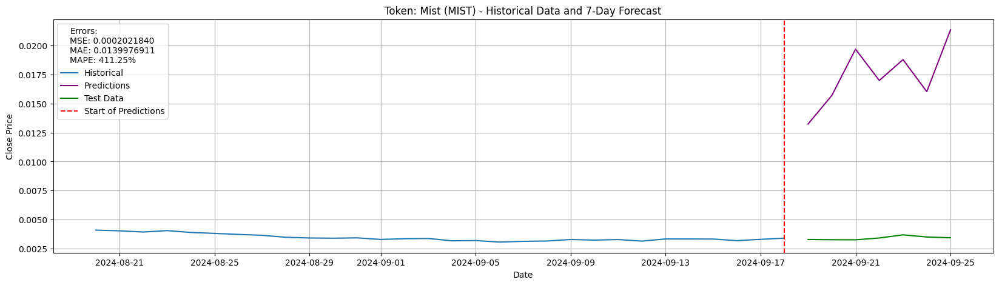

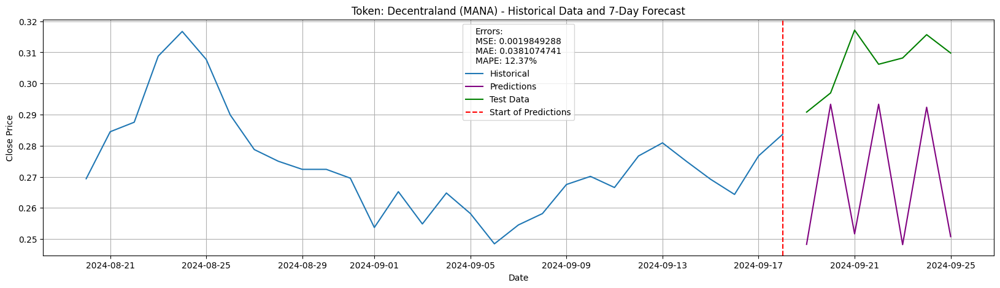

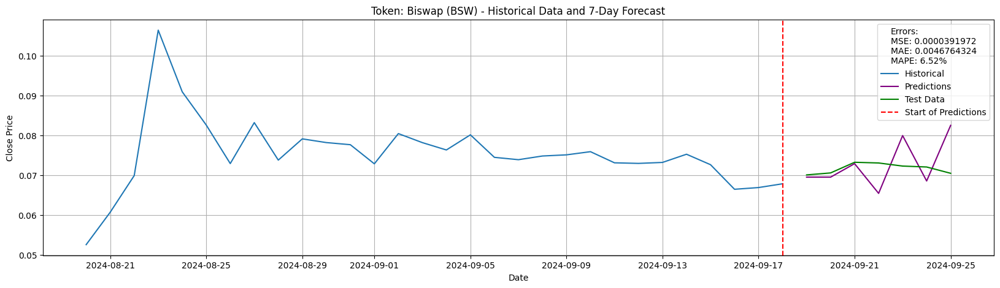

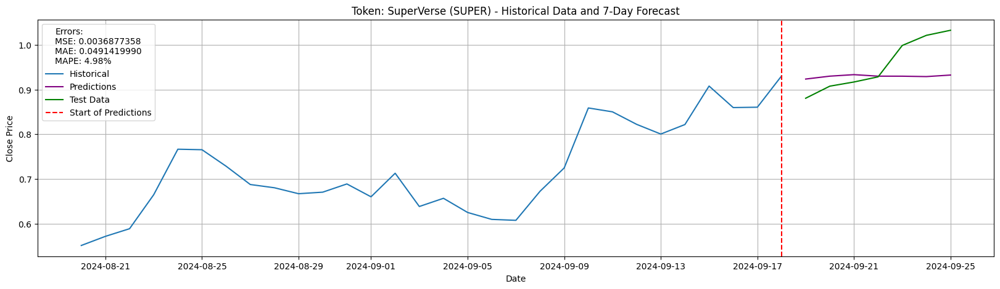

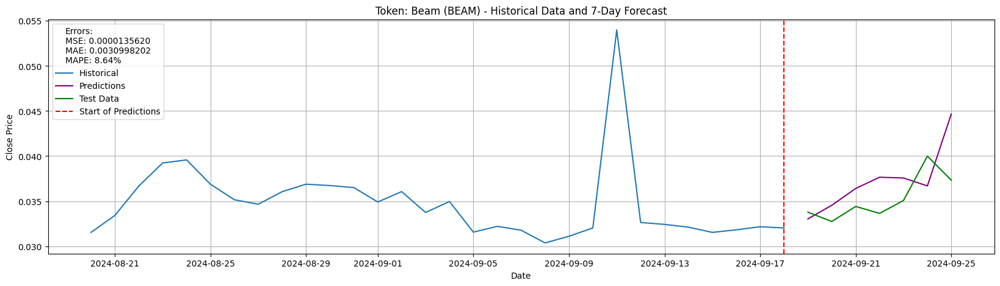

...

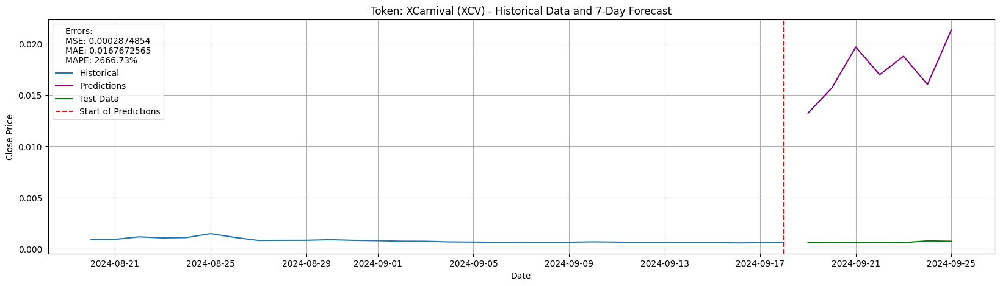

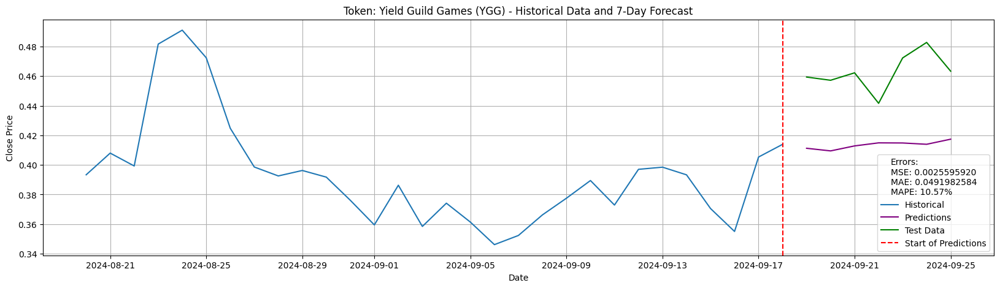

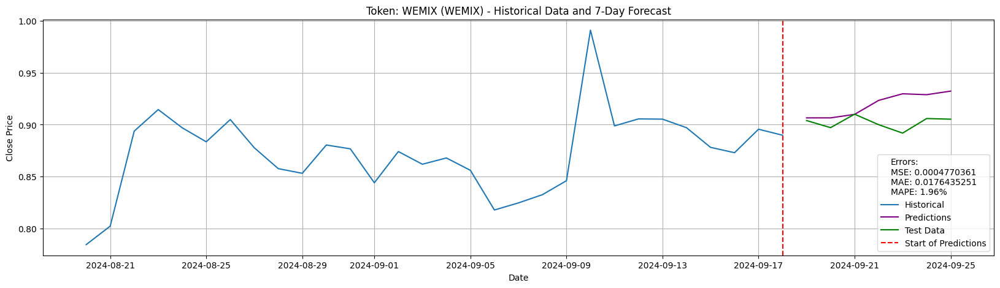

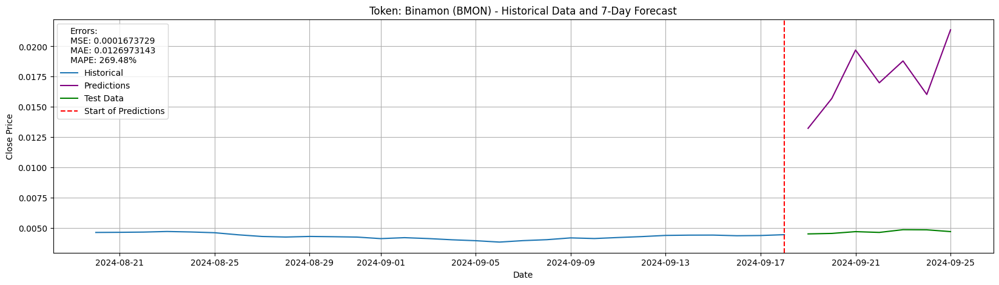

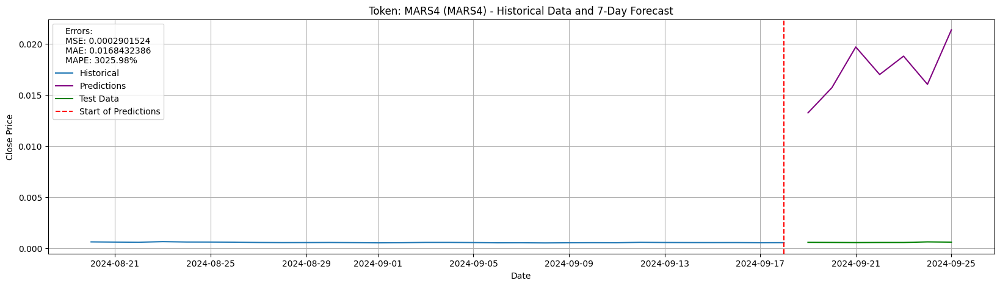

In [14]:
u.plot_predictions(train_data=gaming_obj.og_train, predictions_x_days=gaming_obj.og_pred, test_data=gaming_obj.og_test, last_data_points=30)

In [ ]:
u.plot_predictions(train_data=ai_obj.og_train, predictions_x_days=ai_obj.og_pred, test_data=ai_obj.og_test, last_data_points=30)

In [ ]:
u.plot_predictions(train_data=rwa_obj.og_train, predictions_x_days=rwa_obj.og_pred, test_data=rwa_obj.og_test, last_data_points=30)

In [ ]:
u.plot_predictions(train_data=meme_obj.og_train, predictions_x_days=meme_obj.og_pred, test_data=meme_obj.og_test, last_data_points=-1)